In [1]:
#Importing the essential libraries
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
import matplotlib.pyplot as plt

In [2]:
#Importing stasts model and outliers 
import statsmodels.api as sm
from statsmodels.stats import diagnostic as diag
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [3]:
#Importing linear regression modles 
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

In [4]:
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [5]:
from sklearn.preprocessing import StandardScaler 
from sklearn.linear_model  import Ridge,Lasso,RidgeCV, LassoCV, ElasticNet, ElasticNetCV, LinearRegression

In [6]:
#Importing the dataset in excel format
econ_df = pd.read_excel("Long_term_forecast_template_Distance_covered_v2_Aug_2022.xlsx")

In [8]:
econ_df.head()

,Date,PC_Production,PC_Domestic,PC_Export,PC_Total Sales,HCV_Production,HCV_Domestic,HCV_Export,HCV_Total Sales,LCV_Production,...,Aluminium London Metal Exchange USD/Tonne,CPI General Index,M1 Rs. Million,M3 Rs. Million,Per capita GDP,Per capita GNI,Per capita NNI,Per capita GNDI,Per capita PFCE,Repo Rate
0,1994-06-01,78434.75,73008.25,5960.5,78968.75,25500.50,23976.00,1953.25,25929.25,23249.25,...,1200.000000,95.000000,1922570.0,5275960.0,11292.0,11148.2,10048.1,11427.5,7321.8,13.0
1,1994-09-01,78434.75,73008.25,5960.5,78968.75,25500.50,23976.00,1953.25,25929.25,23249.25,...,1212.000000,95.095000,1922570.0,5275960.0,11292.0,11148.2,10048.1,11427.5,7321.8,13.0
2,1994-12-01,78434.75,73008.25,5960.5,78968.75,25500.50,23976.00,1953.25,25929.25,23249.25,...,1224.120000,95.190095,1922570.0,5275960.0,11292.0,11148.2,10048.1,11427.5,7321.8,13.0
3,1995-03-01,78434.75,73008.25,5960.5,78968.75,25500.50,23976.00,1953.25,25929.25,23249.25,...,1236.361200,95.285285,1922570.0,5275960.0,11292.0,11148.2,10048.1,11427.5,7321.8,13.0
4,1995-06-01,113622.75,104440.50,7959.5,112400.00,32412.75,29945.25,2140.00,32085.25,21946.50,...,1248.724812,95.380570,2148350.0,5991910.0,12991.2,12845.9,11589.5,13084.2,8275.5,13.0


In [9]:
#Seting the date index to date
econ_df = econ_df.set_index('Date')

In [10]:
econ_df.tail()
print(econ_df.shape)

(113, 51)


In [11]:
econ_df.describe

<bound method NDFrame.describe of             PC_Production  PC_Domestic  PC_Export  PC_Total Sales  \
Date                                                                
1994-06-01       78434.75     73008.25     5960.5        78968.75   
1994-09-01       78434.75     73008.25     5960.5        78968.75   
1994-12-01       78434.75     73008.25     5960.5        78968.75   
1995-03-01       78434.75     73008.25     5960.5        78968.75   
1995-06-01      113622.75    104440.50     7959.5       112400.00   
...                   ...          ...        ...             ...   
2021-06-01      800659.00    646273.00   127115.0       773388.00   
2021-09-01      877192.00    741371.00   157560.0       898931.00   
2021-12-01      895793.00    761272.00   139360.0       900632.00   
2022-03-01     1076277.00    919717.00   153714.0      1073431.00   
2022-06-01     1059722.00    910018.00   160264.0      1070282.00   

            HCV_Production  HCV_Domestic  HCV_Export  HCV_Total Sale

In [12]:
#Columns in the dataset
econ_df.columns

Index(['PC_Production', 'PC_Domestic', 'PC_Export', 'PC_Total Sales',
       'HCV_Production', 'HCV_Domestic', 'HCV_Export', 'HCV_Total Sales',
       'LCV_Production', 'LCV_Domestic', 'LCV_Export', 'LCV_Total Sales',
       '2W_Production', '2W_Domestic', '2W_Export', '2W_Total Sales',
       '3W_Production', '3W_Domestic', '3W_Export', '3W_Total Sales', 'GDP',
       'GVA', 'Agriculture,forestry  & fishing ', 'Industry Total ',
       'Mining & quarrying ', 'Manufacturing ',
       'Electricity, gas and  water supply ', 'Construction ',
       'Services Total ',
       'Trade, hotels,  transport, storage,  communication ',
       'Financing,  insurance, real  estate & business  services ',
       'Community, social &  personal services ', 'LT_order', 'Events',
       'Seasonality', 'Road_distance', 'Efficiency', 'Pig Iron Avg Cost',
       'Crude USD/Barrel', 'Copper London Metal Exchange USD/Tonne',
       'Cemment Average wholesale Mumbai Rs/50Kg bag',
       'Aluminium London Meta

In [13]:
#Checking the dataset for null values
econ_df.isnull()

,PC_Production,PC_Domestic,PC_Export,PC_Total Sales,HCV_Production,HCV_Domestic,HCV_Export,HCV_Total Sales,LCV_Production,LCV_Domestic,...,Aluminium London Metal Exchange USD/Tonne,CPI General Index,M1 Rs. Million,M3 Rs. Million,Per capita GDP,Per capita GNI,Per capita NNI,Per capita GNDI,Per capita PFCE,Repo Rate
Date,,,,,,,,,,,,,,,,,,,,,
1994-06-01,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1994-09-01,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1994-12-01,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1995-03-01,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1995-06-01,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-06-01,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2021-09-01,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2021-12-01,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [14]:
econ_df.nunique()

PC_Production                                                 81
PC_Domestic                                                   81
PC_Export                                                     81
PC_Total Sales                                                80
HCV_Production                                                81
HCV_Domestic                                                  81
HCV_Export                                                    81
HCV_Total Sales                                               81
LCV_Production                                                81
LCV_Domestic                                                  81
LCV_Export                                                    81
LCV_Total Sales                                               81
2W_Production                                                 81
2W_Domestic                                                   81
2W_Export                                                     81
2W_Total Sales           

In [15]:
#Basic information about the loaded datset
econ_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 113 entries, 1994-06-01 to 2022-06-01
Data columns (total 51 columns):
 #   Column                                                     Non-Null Count  Dtype  
---  ------                                                     --------------  -----  
 0   PC_Production                                              113 non-null    float64
 1   PC_Domestic                                                113 non-null    float64
 2   PC_Export                                                  113 non-null    float64
 3   PC_Total Sales                                             113 non-null    float64
 4   HCV_Production                                             113 non-null    float64
 5   HCV_Domestic                                               113 non-null    float64
 6   HCV_Export                                                 113 non-null    float64
 7   HCV_Total Sales                                            113 non-null    floa

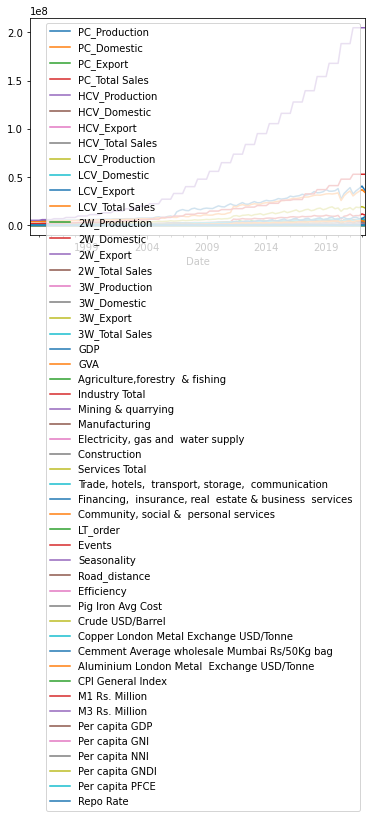

In [16]:
#Basic plot of the dataset
econ_df.plot()

In [19]:
#Importing stats model 
import statsmodels as sm

In [20]:
#Importing adfuller to perform dickey fuller test
from statsmodels.tsa.stattools import adfuller

In [21]:
test_results=adfuller(econ_df['PC_Production'])

In [41]:
#Performing Dickey fuller test to acertain stationarity of the data#
def adfuller_test(PC_Production):
    result=adfuller(PC_production)
    lables =['ADF test Stastics', 'p-value','#lags used','number of observations used']
    for value,lab in zip(result,lables):
        print(lable+ ':' ' '+str(value) )
        if result[1] <= 0.05:
            print("strong evidance aginst null hypothises,reject null hyothises reject the null hypothises.Data has no unit root and is stationart")
        
        else:
            print("weak evidance against null hypothises time series has unit proof,indicating its non stationary")

In [45]:
#Spliting data between Test and Train
XR = econ_df.drop('PC_Total Sales', axis = 1)
YR = econ_df[['PC_Total Sales']]

In [46]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
#This line instantiates the model. 
XR_train, XR_test, yR_train, yR_test = train_test_split(XR, YR, test_size=0.20, random_state=1)

In [47]:
#Spliting the data and traning the data using X_train and Y_Train
rf = RandomForestRegressor(n_estimators=50) 
rf.fit(XR_train, yR_train) 
rf.score(XR_train, yR_train)

0.9991132282118659

In [48]:
#Random forest Regressor
rf.fit(XR_test, yR_test)

RandomForestRegressor(n_estimators=50)

In [49]:
rf.score(XR_test, yR_test)

0.9780620324841759

In [50]:
import pandas as pd
feature_importances = pd.DataFrame(rf.feature_importances_,
                                   index = XR_train.columns,
                                    columns=['importance']).sort_values('importance',ascending=False)
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(feature_importances) 

,importance
2W_Total Sales,0.106334
2W_Production,0.090356
PC_Production,0.060888
Industry Total,0.053761
3W_Production,0.053480
3W_Export,0.053340
2W_Export,0.053003
3W_Total Sales,0.052002
LCV_Export,0.051914
Mining & quarrying,0.041721


In [51]:
#Train and test the data
pred_train3 = pd.DataFrame(rf.predict(XR_train))
pred_test3 = pd.DataFrame(rf.predict(XR_test))
train_mape3 = ((abs((yR_train.values-pred_train3)/yR_train.values)).mean())*100
test_mape3 = ((abs((yR_test.values-pred_test3)/yR_test.values)).mean())*100

In [52]:
param_test = {'max_depth':[3,5,7,8,9,10], 'min_samples_split':[2,3,4,5,6],
                'n_estimators':[50,100,200,400,600,800,1000], 'max_features': ['sqrt' , 'auto']}
gsearch = GridSearchCV(estimator = RandomForestRegressor(random_state=10),param_grid = param_test, scoring='r2',n_jobs=-1,cv=5)
gsearch.fit(XR_train,yR_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(random_state=10), n_jobs=-1,
             param_grid={'max_depth': [3, 5, 7, 8, 9, 10],
                         'max_features': ['sqrt', 'auto'],
                         'min_samples_split': [2, 3, 4, 5, 6],
                         'n_estimators': [50, 100, 200, 400, 600, 800, 1000]},
             scoring='r2')

In [53]:
param_test = {'max_depth':[3,5,7,8,9,10], 'min_samples_split':[2,3,4,5,6],
                'n_estimators':[50,100,200,400,600,800,1000], 'max_features': ['sqrt' , 'auto']}
gsearch = GridSearchCV(estimator = RandomForestRegressor(random_state=10),param_grid = param_test, scoring='r2',n_jobs=-1,cv=5)
gsearch.fit(XR_train,yR_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(random_state=10), n_jobs=-1,
             param_grid={'max_depth': [3, 5, 7, 8, 9, 10],
                         'max_features': ['sqrt', 'auto'],
                         'min_samples_split': [2, 3, 4, 5, 6],
                         'n_estimators': [50, 100, 200, 400, 600, 800, 1000]},
             scoring='r2')

In [54]:
mod=RandomForestRegressor(min_samples_split =gsearch.best_params_['min_samples_split'],\
                          n_estimators = gsearch.best_params_['n_estimators'], max_depth = gsearch.best_params_['max_depth']\
                          ,max_features=gsearch.best_params_['max_features'] ,n_jobs = -1,random_state=10)\
                        .fit(XR_train,yR_train)

RandomForestRegressor()

RandomForestRegressor()

In [55]:
mod.fit(XR_train, yR_train) 
mod.score(XR_train, yR_train)

0.999227290212366

In [56]:
mod.score(XR_test, yR_test)

0.9379882203130386

In [57]:
pred_train = mod.predict(XR_train)
pred_test  = mod.predict(XR_test)

In [58]:
pred_train3 = pd.DataFrame(rf.predict(XR_train))
pred_test3 = pd.DataFrame(rf.predict(XR_test))
train_mape3 = ((abs((yR_train.values-pred_train3)/yR_train.values)).mean())*100
test_mape3 = ((abs((yR_test.values-pred_test3)/yR_test.values)).mean())*100

In [59]:
train_mape3,test_mape3

(0    7.117118
 dtype: float64,
 0    8.071672
 dtype: float64)

In [60]:
import pandas as pd
feature_importances = pd.DataFrame(mod.feature_importances_,
                                   index = XR_train.columns,
                                    columns=['importance']).sort_values('importance',ascending=False)
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  
      display(feature_importances) 
     

,importance
PC_Domestic,0.068180
PC_Production,0.059783
"Trade, hotels, transport, storage, communication",0.054752
"Financing, insurance, real estate & business services",0.053202
Services Total,0.050847
Industry Total,0.046225
Manufacturing,0.045954
LCV_Total Sales,0.041405
2W_Export,0.037055
3W_Total Sales,0.036993


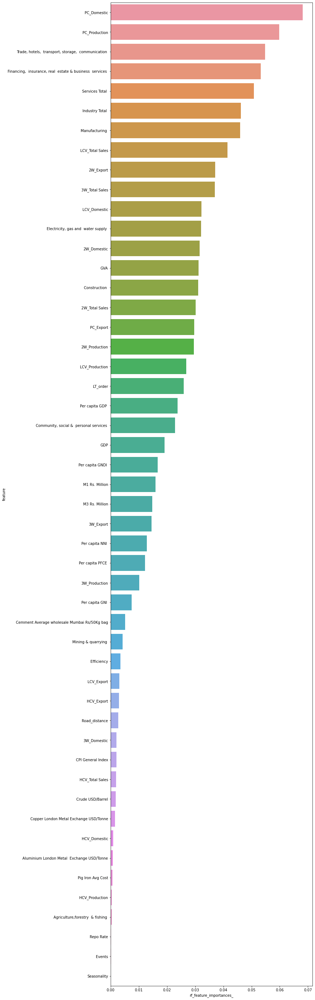

In [61]:
features_df = pd.DataFrame({'feature': XR.columns,'rf_feature_importances_':mod.feature_importances_,})\
    .sort_values('rf_feature_importances_',ascending=False)\
    .reset_index()
#features_df.to_csv("HCV_RF2.csv")
f, ax = plt.subplots(figsize=(10, 50))
sns.barplot(x='rf_feature_importances_',y='feature',data=features_df)

In [63]:
econ_df.columns

Index(['PC_Production', 'PC_Domestic', 'PC_Export', 'PC_Total Sales',
       'HCV_Production', 'HCV_Domestic', 'HCV_Export', 'HCV_Total Sales',
       'LCV_Production', 'LCV_Domestic', 'LCV_Export', 'LCV_Total Sales',
       '2W_Production', '2W_Domestic', '2W_Export', '2W_Total Sales',
       '3W_Production', '3W_Domestic', '3W_Export', '3W_Total Sales', 'GDP',
       'GVA', 'Agriculture,forestry  & fishing ', 'Industry Total ',
       'Mining & quarrying ', 'Manufacturing ',
       'Electricity, gas and  water supply ', 'Construction ',
       'Services Total ',
       'Trade, hotels,  transport, storage,  communication ',
       'Financing,  insurance, real  estate & business  services ',
       'Community, social &  personal services ', 'LT_order', 'Events',
       'Seasonality', 'Road_distance', 'Efficiency', 'Pig Iron Avg Cost',
       'Crude USD/Barrel', 'Copper London Metal Exchange USD/Tonne',
       'Cemment Average wholesale Mumbai Rs/50Kg bag',
       'Aluminium London Meta

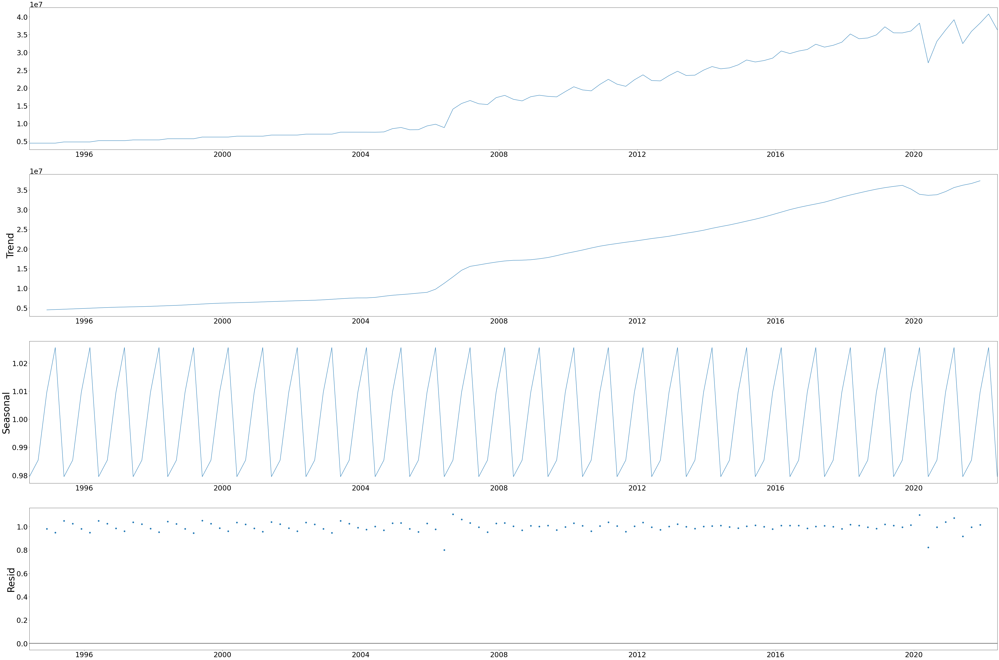

In [64]:
#Seasonality,Trend,Resid
import matplotlib.pyplot as plt
from matplotlib import pyplot
from statsmodels.tsa.seasonal import seasonal_decompose
PC_Sales = econ_df[['GDP']]
result = seasonal_decompose(PC_Sales, model='mulitplicative',period=4)
fig_size = plt.rcParams["figure.figsize"]
#plt.rcParams.update({'font.size': 22}
plt.rc('xtick', labelsize=30) 
plt.rc('ytick', labelsize=30)
plt.rc('font', size=40)
fig_size[0] = 60
fig_size[1] = 40
result.plot(seasonal=True)
pyplot.show()

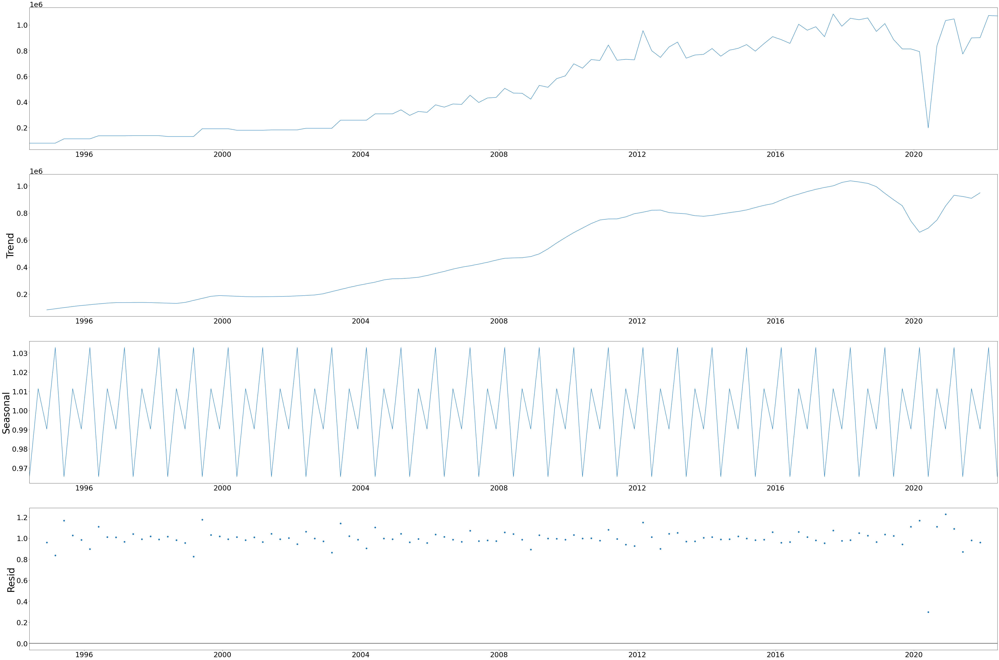

In [67]:
import matplotlib.pyplot as plt
from matplotlib import pyplot
from statsmodels.tsa.seasonal import seasonal_decompose
PC_Sales = econ_df[['PC_Total Sales']]
result = seasonal_decompose(PC_Sales, model='mulitplicative',period=4)
fig_size = plt.rcParams["figure.figsize"]
#plt.rcParams.update({'font.size': 22}
plt.rc('xtick', labelsize=30) 
plt.rc('ytick', labelsize=30)
plt.rc('font', size=40)
fig_size[0] = 60
fig_size[1] = 40
result.plot(seasonal=True)
pyplot.show()

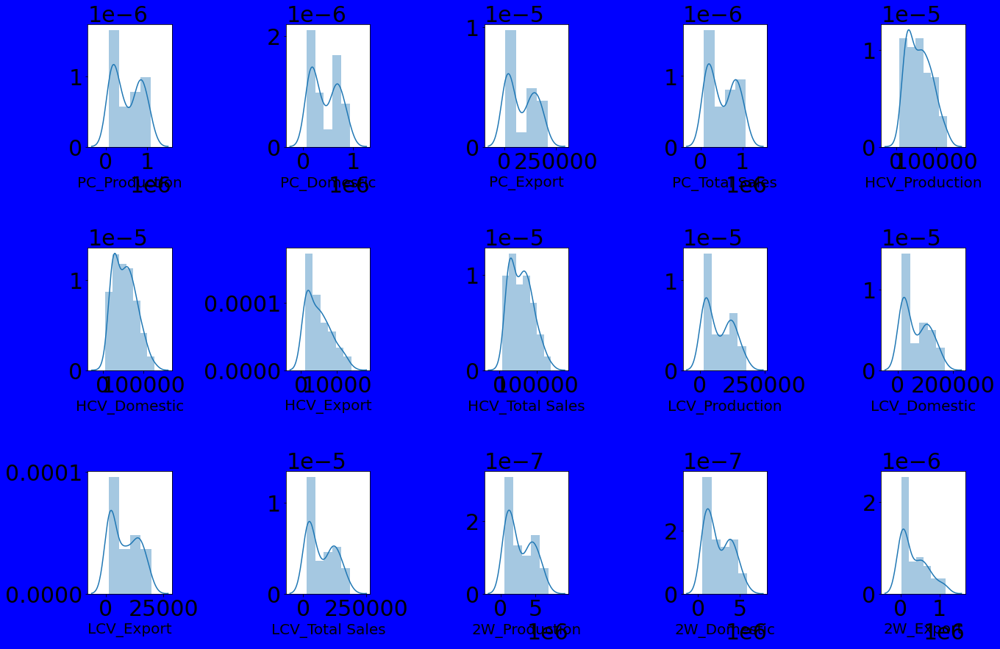

In [68]:
plt.figure(figsize=(20,25), facecolor='blue')
plotnumber = 1

for column in econ_df:
    if plotnumber<=15 :
        ax = plt.subplot(6,5,plotnumber)
        sns.distplot(econ_df[column])
        plt.xlabel(column,fontsize=20)
        #plt.ylabel('Salary',fontsize=20)
    plotnumber+=1
plt.tight_layout()

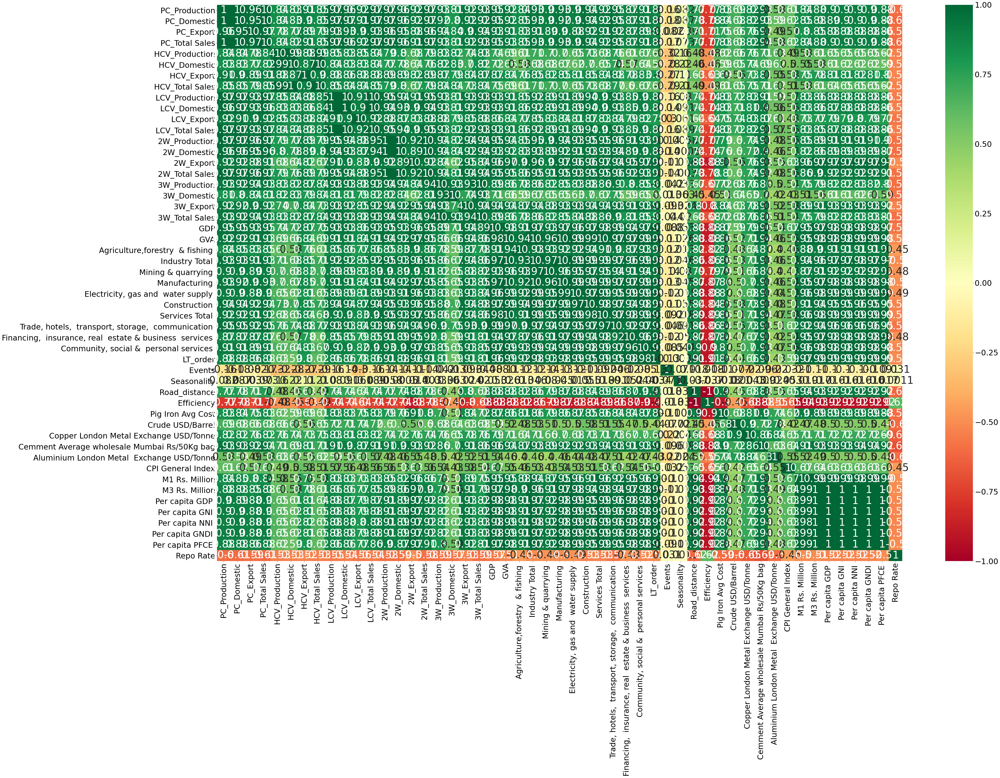

In [69]:
#Correlation matrix
corr1 = econ_df.corr()
# display the correlation matrix
f, ax = plt.subplots(figsize=(60, 40))
# ploting the correlation heatmap
sns.heatmap(corr1, xticklabels=corr1.columns, yticklabels=corr1.columns, cmap='RdYlGn',annot=True)

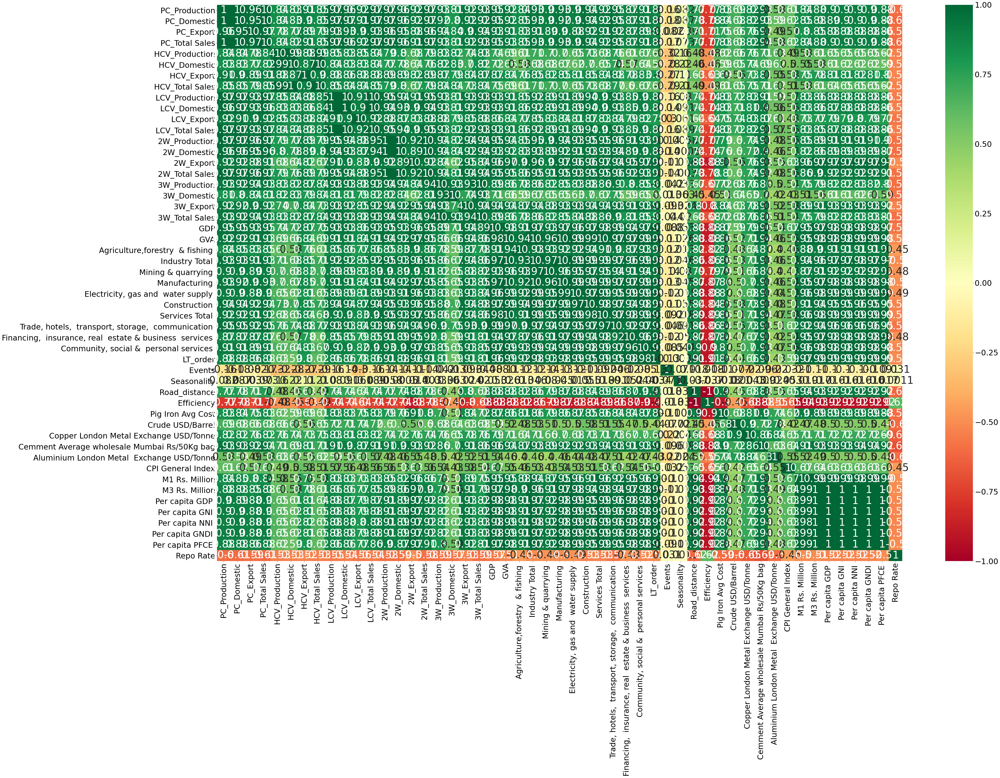

In [71]:
# calculate the correlation matrix
corr2 = econ_df.corr()
#cmap = cmap=sns.diverging_palette(5, 250, as_cmap=True)
# display the correlation matrix
#display(corr)
f, ax = plt.subplots(figsize=(60, 40))
# plot the correlation heatmap
sns.heatmap(corr2, xticklabels=corr2.columns, yticklabels=corr2.columns, cmap='RdYlGn',annot=True)

In [72]:
X = econ_df.drop('PC_Total Sales', axis = 1)
Y = econ_df[['PC_Total Sales']]

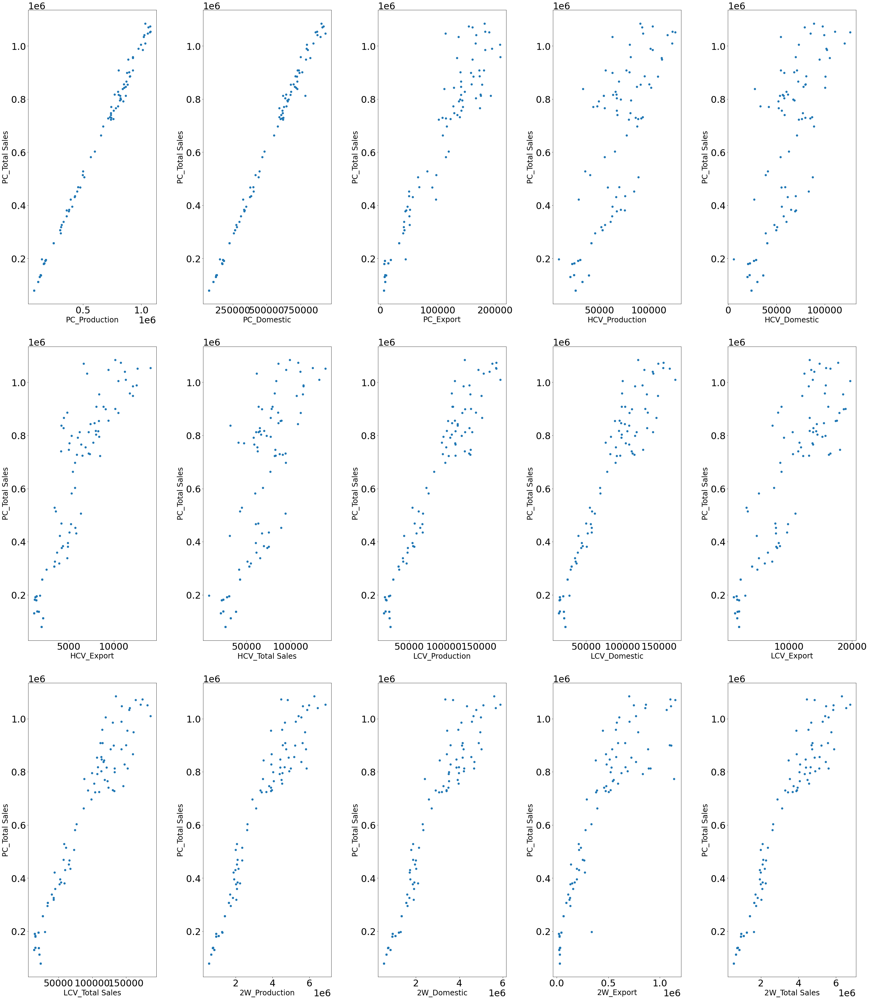

In [73]:
#Ploting PC Total sales using historical data
plt.figure(figsize=(40,60), facecolor='white')
plotnumber = 1

for column in X:
    if plotnumber<=15 :
        ax = plt.subplot(4,5,plotnumber)
        plt.scatter(X[column],Y)
        plt.xlabel(column,fontsize=24)
        plt.ylabel('PC_Total Sales',fontsize=24)
    plotnumber+=1
plt.tight_layout()

In [74]:
#Importing Linear regression model
rom sklearn import linear_model

In [75]:
Bayesian_Reg = linear_model.BayesianRidge()

Text(0.5, 1.0, 'Polynomial Degree = 2')

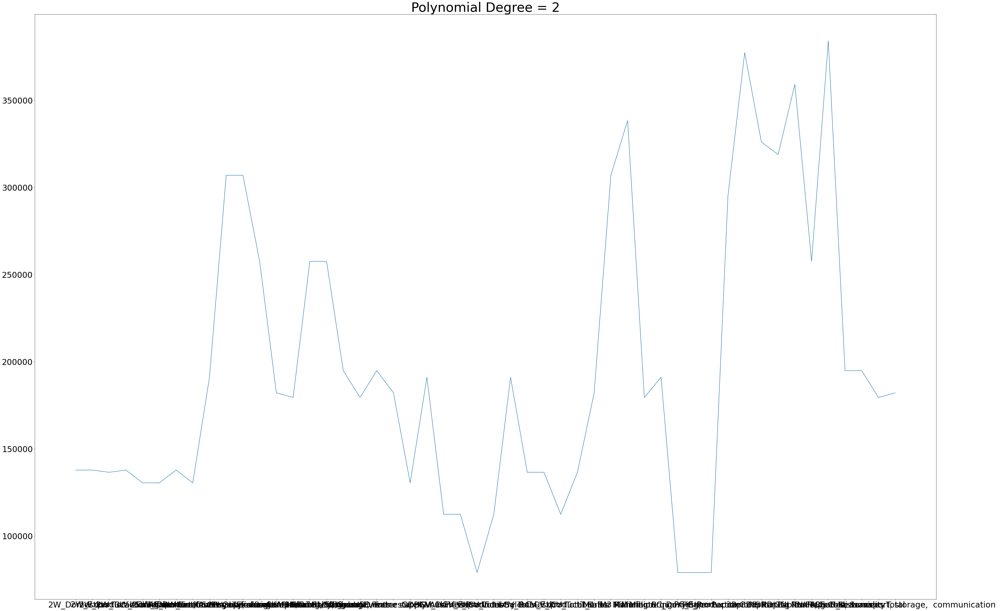

In [82]:
import numpy as np
from sklearn.preprocessing import PolynomialFeatures  
poly_features = PolynomialFeatures(degree = 2)  
X_poly = poly_features.fit_transform(X)
poly_model = LinearRegression()  
poly_model.fit(X_poly, Y)

pred = poly_model.predict(X_poly)
new_X, new_y = zip(*sorted(zip(X, pred))) # sort values for plotting
plt.plot(new_X, new_y)
#plt.scatter(X,Y)
plt.title("Polynomial Degree = 2")

In [83]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
## This line instantiates the model. 
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.20, random_state=1)

In [84]:
rf = RandomForestRegressor(n_estimators=1000) 
## Fit the model on your training data.
rf.fit(X_train, y_train) 
## And score it on your testing data.
rf.score(X_train, y_train)
#rf.score(X_test, y_test)

0.9993733702797266

In [85]:
import pandas as pd
feature_importances = pd.DataFrame(rf.feature_importances_,
                                   index = X_train.columns,
                                    columns=['importance']).sort_values('importance',ascending=False)
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  
    display(feature_importances) 
    

,importance
PC_Production,0.071105
PC_Domestic,0.058712
Industry Total,0.049500
Construction,0.046293
LCV_Total Sales,0.046118
"Trade, hotels, transport, storage, communication",0.046094
Services Total,0.045227
"Financing, insurance, real estate & business services",0.044355
PC_Export,0.040536
2W_Total Sales,0.038125


In [86]:
rf.score(X_test, y_test)

0.940433714812153

In [87]:
rf.fit(X_train, y_train) 
rf.score(X_train, y_train)

0.9993491483881503

In [88]:
rf.score(X_test, y_test)

0.9395239491412164

In [89]:
pred_train3 = pd.DataFrame(rf.predict(X_train))
pred_test3 = pd.DataFrame(rf.predict(X_test))
train_mape3 = ((abs((y_train.values-pred_train3)/y_train.values)).mean())*100
test_mape3 = ((abs((y_test.values-pred_test3)/y_test.values)).mean())*100

In [90]:
train_mape3,test_mape3

(0    0.90862
 dtype: float64,
 0    10.523759
 dtype: float64)